# Visualization Libraries & Imports

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
#install opencv
!pip install -q opencv-python

In [ ]:
import csv
import cv2 
import itertools
import numpy as np
import pandas as pd
import os
import sys
import tempfile
import tqdm

import tensorflow as tf
import tensorflow_hub as hub
from tensorflow import keras

from matplotlib import pyplot as plt
from matplotlib.collections import LineCollection

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

In [ ]:
# Download movenet Thunder model from TensorFlow Hub 
!wget -q -O movenet_thunder.tflite https://tfhub.dev/google/lite-model/movenet/singlepose/thunder/tflite/float16/4?lite-format=tflite
!git clone https://github.com/tensorflow/examples.git
pose_sample_rpi_path = os.path.join(os.getcwd(), 'examples/lite/examples/pose_estimation/raspberry_pi')
sys.path.append(pose_sample_rpi_path)

fatal: destination path 'examples' already exists and is not an empty directory.


In [ ]:
# Load the MoveNet Thunder model
import utils
from data import BodyPart
from ml import Movenet
movenet_model = Movenet('movenet_thunder')

In [ ]:
# Define functions to run pose Estimation
def detection_on_input_image(input_tensor, inference_count=3):
  """
  Runs detection on an input image. 

  Args:
    input_tensor: A [height, width, 3] tensor of type tf.float32.
    
    inference_count: Number of times the model should run repeatedly
        on the same input image to improve detection accuracy.
      
  Returns:
    A person entity detected by the MoveNet.SinglePose
  """
  image_height, image_width, channel = input_tensor.shape

  # Detect pose using the full input image
  movenet_model.detect(input_tensor.numpy(), reset_crop_region=True)

  #To identify the region of interest and crop that region to improve detection accuracy
  for _ in range(inference_count - 1):
    person = movenet_model.detect(input_tensor.numpy(),
                            reset_crop_region=False)
    
  return person

In [ ]:
#Functions to visualize the results

def draw_prediction_on_image(
    image, person, crop_region=None, close_figure=True,
    keep_input_size=False):
  """Draws the keypoint predictions on image.

  Args:
  image: A numpy array representing the pixel values of the input image.
  person: A person entity returned from the MoveNet.SinglePose model.
  
  Returns:
    A numpy array representing the image overlaid with keypoint predictions. 
  """
  # Draw the detection result on top of the image. 
  image_np = utils.visualize(image, [person])

  # Plot the image with detection results.
  height, width, channel = image.shape
  aspect_ratio = float(width) / height 
  fig, ax = plt.subplots(figsize=(12 * aspect_ratio, 12))
  im = ax.imshow(image_np)

  if close_figure:
    plt.close(fig)

  if not keep_input_size:
    image_np = utils.keep_aspect_ratio_resizer(image_np, (512, 512))

  return image_np

In [ ]:
# Load images, detect pose landmarks and save to CSV 
class MoveNet_Preprocessor(object):
  """Helper class to preprocess pose sample images for classification."""
  
  def __init__(self,
               images_in_folder,
               images_out_folder,
               csvs_out_path):
    """Creates a preprocessor to detect pose from images and save as csv.

    Args:
      images_in_folder: Path to folder with input images. 
      images_out_folder: Path to write the images overlay with detected
          landmarks. 
      csvs_out_path: Path to write the CSV containing the detected landmark
          coordinates and label of each image.
    """
    self._images_in_folder = images_in_folder
    self._images_out_folder = images_out_folder
    self._csvs_out_path = csvs_out_path
    self._messages = []

    # Create a temporary directory to store the pose CSVs per class
    self._csvs_out_folder_per_class = tempfile.mkdtemp()

    # Get list of pose classes and print image statistics 
    self._pose_class_names = sorted(
        [n for n in os.listdir(self._images_in_folder) if not \
         n.startswith('.')])
    
  def preprocess(self, per_pose_class_limit=None, detection_threshold=0.1):
    """Preprocesses images in the given folder.
    Args:
      per_pose_class_limit: No. images to load.
      detection_threshold: Only keep images with all landmark confidence
          score above this threshold
    """
    # Loop through the classes and preprocess its images
    for pose_class_name in self._pose_class_names:
      print('Preprocessing', pose_class_name, file=sys.stderr)

      # Paths for the pose class
      images_in_folder = os.path.join(self._images_in_folder, pose_class_name)
      images_out_folder = os.path.join(self._images_out_folder, pose_class_name)
      csv_out_path = os.path.join(self._csvs_out_folder_per_class, 
                                  pose_class_name + '.csv')
      
      # if path does not exist then create the images_out_folder
      if not os.path.exists(images_out_folder):
        os.makedirs(images_out_folder)

      # Detect landmarks and write it to a CSV file
      with open(csv_out_path, 'w') as csv_out_file:
        csv_out_writer = csv.writer(csv_out_file, 
                                    delimiter=',',
                                    quoting=csv.QUOTE_MINIMAL)
        # Get list of images
        image_names = sorted(
            [n for n in os.listdir(images_in_folder) if not n.startswith('.')])
        if per_pose_class_limit is not None:
          image_names = image_names[:per_pose_class_limit]

        valid_image_count = 0

        # Detect pose landmarks from each image
        for image_name in tqdm.tqdm(image_names):
          image_path = os.path.join(images_in_folder, image_name)

          try:
            image = tf.io.read_file(image_path)
            image = tf.io.decode_jpeg(image)
          except:
            self._messages.append('Skipped ' + image_path + '. Invalid image.')
            continue
          else:
            image = tf.io.read_file(image_path)
            image = tf.io.decode_jpeg(image)
            image_height, image_width, channel = image.shape

          # Skip images other than RGB.
          if channel != 3:
            self._messages.append('Skipped ' + image_path + 
                                  '. Image is not in the RGB format.')
            continue
          person = detection_on_input_image(image)

          # Save landmarks if all landmarks were detected 
          min_landmarks_score = min(
              [keypoint.score for keypoint in person.keypoints])
          should_keep_image = min_landmarks_score >= detection_threshold
          if not should_keep_image:
            self._messages.append('Skipped ' + image_path + 
                                  '. No pose was confidentally detected.')
            continue
          
          valid_image_count += 1

          # Draw the prediction result on top of the image
          output_overlay = draw_prediction_on_image(
              image.numpy().astype(np.uint8), person, 
              close_figure=True, keep_input_size=True)
          
          # Write detection result into an image file
          output_frame = cv2.cvtColor(output_overlay, cv2.COLOR_RGB2BGR)
          cv2.imwrite(os.path.join(images_out_folder, image_name), output_frame)

          # Scale landmarks to the same size as the input image
          pose_landmarks = np.array(
              [[keypoint.coordinate.x, keypoint.coordinate.y, keypoint.score]
              for keypoint in person.keypoints],
              dtype=np.float32)
          
          # Write landmark coordinates to its per-class CSV file
          landmark_coordinates = pose_landmarks.flatten().astype(str).tolist()
          csv_out_writer.writerow([image_name] + landmark_coordinates)

        if not valid_image_count:
          raise RuntimeError(
              'No valid images for the "{}" class.'
              .format(pose_class_name))
    
    # Print the error message collected during preprocessing 
    print('\n'.join(self._messages))

    # Combine all per-class CSVs into a single output file
    all_landmarks_df = self._all_landmarks_as_dataframe()
    all_landmarks_df.to_csv(self._csvs_out_path, index=False)

  def class_names(self):
    """List of classes found in the training dataset."""
    return self._pose_class_names

  def _all_landmarks_as_dataframe(self):
    """Merge all per-class CSVs into a single dataframe."""
    total_df = None
    for class_index, class_name in enumerate(self._pose_class_names):
      csv_out_path = os.path.join(self._csvs_out_folder_per_class,
                                  class_name + '.csv')
      per_class_df = pd.read_csv(csv_out_path, header=None)

      # Add labels to the dataframe
      per_class_df['class_no'] = [class_index]*len(per_class_df)
      per_class_df['class_name'] = [class_name]*len(per_class_df)

      # Append the folder name to the filename column
      per_class_df[per_class_df.columns[0]] = (os.path.join(class_name, '')
      + per_class_df[per_class_df.columns[0]].astype(str))

      if total_df is None:
        # For the first class, assign its data to the total dataframe
        total_df = per_class_df
      else:
        # Concatenate each class's data into the total dataframe
        total_df = pd.concat([total_df, per_class_df], axis=0)

    list_name = [[bodypart.name + '_x', bodypart.name + '_y', 
                  bodypart.name + '_score'] for bodypart in BodyPart]

    header_name = []
    for columns_name in list_name:
      header_name += columns_name
    header_name = ['file_name'] + header_name 
    header_map = {total_df.columns[i]: header_name[i]
                  for i in range(len(header_name))}

    total_df.rename(header_map, axis=1, inplace=True)

    return total_df     

--2022-09-29 03:26:52--  https://cdn.pixabay.com/photo/2017/03/03/17/30/yoga-2114512_960_720.jpg
Resolving cdn.pixabay.com (cdn.pixabay.com)... 104.18.37.244, 172.64.150.12, 2606:4700:4400::6812:25f4, ...
Connecting to cdn.pixabay.com (cdn.pixabay.com)|104.18.37.244|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 30059 (29K) [image/jpeg]
Saving to: ‘/tmp/image.jpeg’

/tmp/image.jpeg     100%[===================>]  29.35K  --.-KB/s    in 0.001s  

2022-09-29 03:26:53 (29.4 MB/s) - ‘/tmp/image.jpeg’ saved [30059/30059]



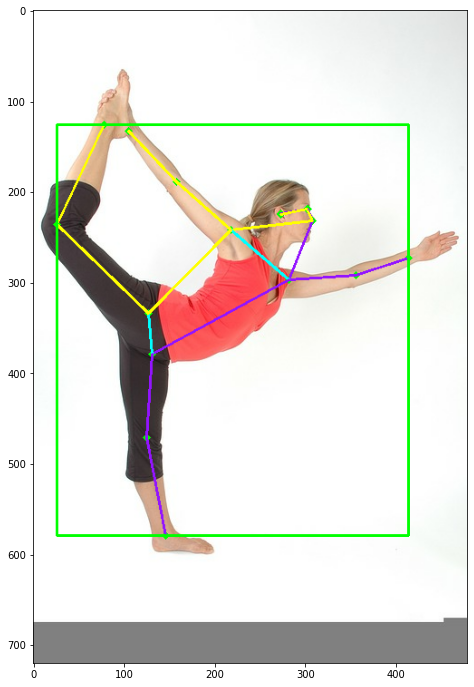

In [ ]:
# Code snippet to try out the MoveNet pose estimation logic
# You can download an image from the internet, run this code, and plot
# Useful for debugging

test_image = "https://cdn.pixabay.com/photo/2017/03/03/17/30/yoga-2114512_960_720.jpg"
!wget -O /tmp/image.jpeg {test_image}

if len(test_image):
  image = tf.io.read_file('/tmp/image.jpeg')
  image = tf.io.decode_jpeg(image)
  person = detection_on_input_image(image)
  _ = draw_prediction_on_image(image.numpy(), person, crop_region=None, 
                               close_figure=False, keep_input_size=True)

In [ ]:
!unzip '/content/gdrive/MyDrive/yoga10_new.zip'

Archive:  /content/gdrive/MyDrive/yoga10_new.zip
replace yoga10_new/yoga_poses/test/Bhujangasana/100-0.png? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: yoga10_new/yoga_poses/test/Bhujangasana/100-0.png  
  inflating: yoga10_new/yoga_poses/test/Bhujangasana/101-0.png  
  inflating: yoga10_new/yoga_poses/test/Bhujangasana/102-0.png  
  inflating: yoga10_new/yoga_poses/test/Bhujangasana/103-0.png  
  inflating: yoga10_new/yoga_poses/test/Bhujangasana/104-0.png  
  inflating: yoga10_new/yoga_poses/test/Bhujangasana/105-0.png  
  inflating: yoga10_new/yoga_poses/test/Bhujangasana/106-0.png  
  inflating: yoga10_new/yoga_poses/test/Bhujangasana/108-0.png  
  inflating: yoga10_new/yoga_poses/test/Bhujangasana/109-0.png  
  inflating: yoga10_new/yoga_poses/test/Bhujangasana/77-0.png  
  inflating: yoga10_new/yoga_poses/test/Bhujangasana/78-0.png  
  inflating: yoga10_new/yoga_poses/test/Bhujangasana/79-1.png  
  inflating: yoga10_new/yoga_poses/test/Bhujangasana/80-0.png  
  inflating

In [ ]:
dataset_in = "/content/yoga10_new/yoga_poses/train/"
dataset_out = '/content/yoga10_new/yoga_poses/'

# Preprocess the TRAIN dataset

In [ ]:
images_in_train_folder = "/content/yoga10_new/yoga_poses/train/"
images_out_train_folder = 'poses_images_out_train'
csvs_out_train_path = 'train_data.csv'

preprocessor = MoveNet_Preprocessor(
    images_in_folder=images_in_train_folder,
    images_out_folder=images_out_train_folder,
    csvs_out_path=csvs_out_train_path,
)

preprocessor.preprocess(per_pose_class_limit=None)

Preprocessing Bhujangasana
100%|██████████| 53/53 [00:05<00:00, 10.12it/s]
Preprocessing Garudasana
100%|██████████| 48/48 [00:04<00:00, 10.43it/s]
Preprocessing Halasana
100%|██████████| 46/46 [00:03<00:00, 11.56it/s]
Preprocessing Makarasana
100%|██████████| 40/40 [00:04<00:00,  9.98it/s]
Preprocessing Natarajasana
100%|██████████| 53/53 [00:05<00:00, 10.39it/s]
Preprocessing Savasana
100%|██████████| 37/37 [00:03<00:00, 10.30it/s]
Preprocessing Simhasana
100%|██████████| 40/40 [00:03<00:00, 11.50it/s]
Preprocessing Sukhasana
100%|██████████| 60/60 [00:05<00:00, 10.21it/s]
Preprocessing Vajrasana
100%|██████████| 40/40 [00:03<00:00, 12.90it/s]
Preprocessing kapotasana
100%|██████████| 45/45 [00:04<00:00,  9.99it/s]

Skipped /content/yoga10_new/yoga_poses/train/Bhujangasana/2-0.png. No pose was confidentally detected.
Skipped /content/yoga10_new/yoga_poses/train/Bhujangasana/29-1.png. Image is not in the RGB format.
Skipped /content/yoga10_new/yoga_poses/train/Garudasana/3-0.png. No pose was confidentally detected.
Skipped /content/yoga10_new/yoga_poses/train/Garudasana/43-0.png. No pose was confidentally detected.
Skipped /content/yoga10_new/yoga_poses/train/Garudasana/58-0.png. No pose was confidentally detected.
Skipped /content/yoga10_new/yoga_poses/train/Garudasana/62-1.png. No pose was confidentally detected.
Skipped /content/yoga10_new/yoga_poses/train/Halasana/0-0.png. No pose was confidentally detected.
Skipped /content/yoga10_new/yoga_poses/train/Halasana/100-0.png. Image is not in the RGB format.
Skipped /content/yoga10_new/yoga_poses/train/Halasana/101-0.png. Image is not in the RGB format.
Skipped /content/yoga10_new/yoga_poses/train/Halasana/102-0.png. Image is not in the RGB format.


#Preprocess the TEST dataset

In [ ]:
images_in_test_folder = "/content/yoga10_new/yoga_poses/test/"
images_out_test_folder = 'poses_images_out_test'
csvs_out_test_path = 'test_data.csv'

preprocessor = MoveNet_Preprocessor(
    images_in_folder=images_in_test_folder,
    images_out_folder=images_out_test_folder,
    csvs_out_path=csvs_out_test_path,
)

preprocessor.preprocess(per_pose_class_limit=None)

Preprocessing Bhujangasana
100%|██████████| 28/28 [00:02<00:00, 10.58it/s]
Preprocessing Garudasana
100%|██████████| 30/30 [00:02<00:00, 10.89it/s]
Preprocessing Halasana
100%|██████████| 30/30 [00:02<00:00, 10.76it/s]
Preprocessing Makarasana
100%|██████████| 30/30 [00:01<00:00, 15.21it/s]
Preprocessing Natarajasana
100%|██████████| 31/31 [00:02<00:00, 12.75it/s]
Preprocessing Savasana
100%|██████████| 30/30 [00:03<00:00,  8.34it/s]
Preprocessing Simhasana
100%|██████████| 30/30 [00:01<00:00, 17.47it/s]
Preprocessing Sukhasana
100%|██████████| 30/30 [00:01<00:00, 17.40it/s]
Preprocessing Vajrasana
100%|██████████| 30/30 [00:02<00:00, 11.12it/s]
Preprocessing kapotasana
100%|██████████| 12/12 [00:01<00:00, 11.13it/s]


Skipped /content/yoga10_new/yoga_poses/test/Bhujangasana/100-0.png. Image is not in the RGB format.
Skipped /content/yoga10_new/yoga_poses/test/Bhujangasana/101-0.png. Image is not in the RGB format.
Skipped /content/yoga10_new/yoga_poses/test/Bhujangasana/102-0.png. Image is not in the RGB format.
Skipped /content/yoga10_new/yoga_poses/test/Bhujangasana/103-0.png. Image is not in the RGB format.
Skipped /content/yoga10_new/yoga_poses/test/Bhujangasana/104-0.png. Image is not in the RGB format.
Skipped /content/yoga10_new/yoga_poses/test/Bhujangasana/105-0.png. Image is not in the RGB format.
Skipped /content/yoga10_new/yoga_poses/test/Bhujangasana/106-0.png. Image is not in the RGB format.
Skipped /content/yoga10_new/yoga_poses/test/Bhujangasana/108-0.png. Image is not in the RGB format.
Skipped /content/yoga10_new/yoga_poses/test/Bhujangasana/109-0.png. Image is not in the RGB format.
Skipped /content/yoga10_new/yoga_poses/test/Bhujangasana/82-1.png. No pose was confidentally detecte

# Train a Pose Classification Model
Model takes landmark coordinates as input and outputs the predicted labels

## Load and split datasets

In [ ]:
def load_pose_landmarks(csv_path):
  """Loads a CSV created by MoveNetPreprocessor.
  
  Returns:
    X: Detected landmark coordinates and scores 
    y: Ground truth labels 
    classes: The list of all class names found in the dataset
    dataframe: The CSV loaded as a Pandas dataframe.
  """

  # read the CSV file
  df = pd.read_csv(csv_path)
  df_to_process = df.copy()

  # Drop the file_name columns
  df_to_process.drop(columns=['file_name'], inplace=True)

  # Extract the list of class names
  classes = df_to_process.pop('class_name').unique()

  # Extract the labels
  y = df_to_process.pop('class_no')

  # Convert the input features and labels into the correct format for training.
  X = df_to_process.astype('float64')
  y = keras.utils.to_categorical(y)

  return X, y, classes, df

In [ ]:
# Load the train data
X, y, class_names, _ = load_pose_landmarks(csvs_out_train_path)

# Split training data (X, y) into (X_train, y_train) and (X_val, y_val)
X_train, X_val, y_train, y_val = train_test_split(X, y,
                                                  test_size=0.15)

In [ ]:
# Load the test data
X_test, y_test, _, df_test = load_pose_landmarks(csvs_out_test_path)

## Define functions to convert the pose landmarks to a pose embedding (a.k.a. feature vector) for pose classification <br>

Next, convert the landmark coordinates to a feature vector by:

1. Moving the pose center to the origin.
Scaling the pose so that the pose size becomes 1
2. Flattening these coordinates into a feature vector
3. Then use this feature vector to train a neural-network based pose classifier.



In [ ]:
def get_center_point(landmarks, left_bodypart, right_bodypart):
  """Calculates the center point of landmarks."""

  left_landmark = tf.gather(landmarks, left_bodypart.value, axis=1)
  right_landmark = tf.gather(landmarks, right_bodypart.value, axis=1)
  center_point = left_landmark * 0.5 + right_landmark * 0.5
  return center_point


def get_pose_size(landmarks, torso_size_multiplier=2.5):
  """Calculates pose size"""
  # Hips center
  hips_center_point = get_center_point(landmarks, BodyPart.LEFT_HIP, 
                                 BodyPart.RIGHT_HIP)

  # Shoulders center
  shoulders_center_point = get_center_point(landmarks, BodyPart.LEFT_SHOULDER,
                                      BodyPart.RIGHT_SHOULDER)

  # Torso size as the minimum body size
  torso_size = tf.linalg.norm(shoulders_center_point - hips_center_point)

  # New Pose center
  new_pose_center = get_center_point(landmarks, BodyPart.LEFT_HIP, 
                                     BodyPart.RIGHT_HIP)
  new_pose_center = tf.expand_dims(new_pose_center, axis=1)
  # Broadcast the pose center to the same size as the landmark vector to
  # perform substraction
  new_pose_center= tf.broadcast_to(new_pose_center,
                                    [tf.size(landmarks) // (17*2), 17, 2])

  # Dist to pose center
  distance = tf.gather(landmarks - new_pose_center, 0, axis=0,
                name="dist_to_pose_center")
  # Max dist to pose center
  max_distance = tf.reduce_max(tf.linalg.norm(distance, axis=0))

  # Normalize scale
  pose_size = tf.maximum(torso_size * torso_size_multiplier, max_distance)

  return pose_size


def normalize_pose_landmarks(landmarks):
  """Normalizes the landmarks translation"""
  # Move landmarks so that the pose center becomes (0,0)
  pose_center_point = get_center_point(landmarks, BodyPart.LEFT_HIP, 
                                 BodyPart.RIGHT_HIP)
  pose_center_point = tf.expand_dims(pose_center_point, axis=1)
  # Broadcast the pose center to the same size 
  pose_center_point = tf.broadcast_to(pose_center_point, 
                                [tf.size(landmarks) // (17*2), 17, 2])
  landmarks = landmarks - pose_center_point

  # Scale the landmarks to a constant pose size
  pose_size = get_pose_size(landmarks)
  landmarks /= pose_size

  return landmarks


def landmarks_to_embedding(landmarks_and_scores):
  """Converts the input landmarks into a pose embedding."""
  # Reshape the flat input into a matrix 
  reshaped_inputs = keras.layers.Reshape((17, 3))(landmarks_and_scores)

  # Normalize landmarks 2D
  landmarks = normalize_pose_landmarks(reshaped_inputs[:, :, :2])

  # Flatten the normalized landmark coordinates into a vector
  embedding = keras.layers.Flatten()(landmarks)

  return embedding

# Define a Keras model for pose classification

Our Keras model takes the detected pose landmarks, then calculates the pose embedding and predicts the pose class.

In [ ]:
RANDOM_STATE=2022
krnl_init = tf.keras.initializers.HeNormal( seed = RANDOM_STATE) 

In [ ]:
# Define the model
inputs = tf.keras.Input(shape=(51))
embedding = landmarks_to_embedding(inputs)

layer = keras.layers.Dense(128, activation=tf.nn.relu6,kernel_initializer = krnl_init)(embedding)
layer = keras.layers.BatchNormalization()(layer)
layer = keras.layers.Dense(64, activation=tf.nn.relu6,kernel_initializer = krnl_init)(layer)
layer = keras.layers.BatchNormalization()(layer)
layer = keras.layers.Dense(32, activation=tf.nn.relu6,kernel_initializer = krnl_init)(layer)
layer = keras.layers.BatchNormalization()(layer)
#layer = keras.layers.Dense(16, activation=tf.nn.relu6)(layer)
#layer = keras.layers.BatchNormalization()(layer)
outputs = keras.layers.Dense(len(class_names), activation="softmax")(layer)

model = keras.Model(inputs, outputs)
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 51)]         0           []                               
                                                                                                  
 reshape_2 (Reshape)            (None, 17, 3)        0           ['input_3[0][0]']                
                                                                                                  
 tf.__operators__.getitem_2 (Sl  (None, 17, 2)       0           ['reshape_2[0][0]']              
 icingOpLambda)                                                                                   
                                                                                                  
 tf.compat.v1.gather_18 (TFOpLa  (None, 2)           0           ['tf.__operators__.getitem_

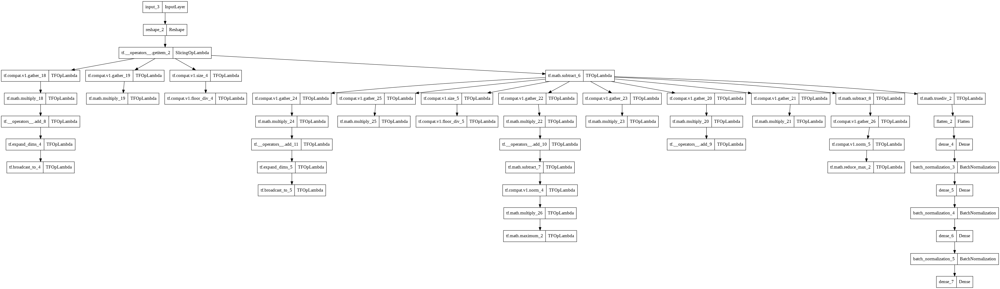

In [ ]:
from tensorflow import keras
keras.utils.plot_model(model)

In [ ]:
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Store the checkpoint that has the highest validation accuracy.
checkpoint_path = "weights.best.hdf5"
checkpoint = keras.callbacks.ModelCheckpoint(checkpoint_path,
                             monitor='val_accuracy',
                             verbose=1,
                             save_best_only=True,
                             mode='max')
earlystopping = keras.callbacks.EarlyStopping(monitor='val_accuracy', 
                                              patience=20)

# Train the model
history = model.fit(X_train, y_train,
                    epochs=200,
                    batch_size=16,
                    validation_data=(X_val, y_val),
                    callbacks=[checkpoint, earlystopping])

Epoch 1/200
 1/20 [>.............................] - ETA: 18s - loss: 2.9553 - accuracy: 0.0625
Epoch 1: val_accuracy improved from -inf to 0.16364, saving model to weights.best.hdf5
20/20 [==============================] - 1s 23ms/step - loss: 2.2190 - accuracy: 0.2516 - val_loss: 2.2444 - val_accuracy: 0.1636
Epoch 2/200
 1/20 [>.............................] - ETA: 0s - loss: 1.2214 - accuracy: 0.6875
Epoch 2: val_accuracy did not improve from 0.16364
20/20 [==============================] - 0s 4ms/step - loss: 1.2499 - accuracy: 0.6569 - val_loss: 2.2057 - val_accuracy: 0.1636
Epoch 3/200
 1/20 [>.............................] - ETA: 0s - loss: 0.8745 - accuracy: 0.8125
Epoch 3: val_accuracy improved from 0.16364 to 0.18182, saving model to weights.best.hdf5
20/20 [==============================] - 0s 6ms/step - loss: 0.9373 - accuracy: 0.7712 - val_loss: 2.1808 - val_accuracy: 0.1818
Epoch 4/200
 1/20 [>.............................] - ETA: 0s - loss: 1.0569 - accuracy: 0.6250
Epo

# Visualize the training history 

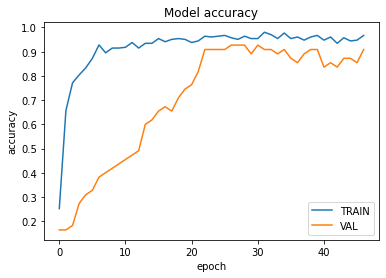

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['TRAIN', 'VAL'], loc='lower right')
plt.show()

In [ ]:
# Evaluate the model using the TEST dataset
loss, accuracy = model.evaluate(X_test, y_test)

6/6 [==============================] - 0s 2ms/step - loss: 0.3760 - accuracy: 0.8865


# Draw the confusion matrix to better understand the model performance

Confusion matrix, without normalization

Classification Report:
               precision    recall  f1-score   support

Bhujangasana       1.00      0.82      0.90        17
  Garudasana       0.94      1.00      0.97        30
    Halasana       1.00      0.96      0.98        25
  Makarasana       0.88      0.88      0.88        17
Natarajasana       1.00      0.88      0.94        17
    Savasana       0.92      0.92      0.92        26
   Simhasana       0.42      0.89      0.57         9
   Sukhasana       1.00      0.78      0.88         9
   Vajrasana       0.90      0.72      0.80        25
  kapotasana       0.82      0.90      0.86        10

    accuracy                           0.89       185
   macro avg       0.89      0.88      0.87       185
weighted avg       0.92      0.89      0.89       185



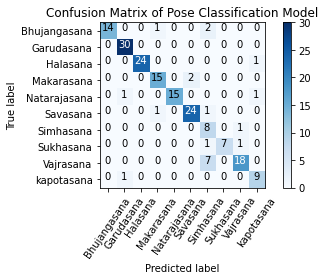

In [ ]:
def confusion_matrix_plot(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
  """Plots the confusion matrix."""
  if normalize:
    cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    print("Normalized confusion matrix")
  else:
    print('Confusion matrix, without normalization')

  plt.imshow(cm, interpolation='nearest', cmap=cmap)
  plt.title(title)
  plt.colorbar()
  tick_marks = np.arange(len(classes))
  plt.xticks(tick_marks, classes, rotation=55)
  plt.yticks(tick_marks, classes)
  fmt = '.2f' if normalize else 'd'
  thresh = cm.max() / 2.
  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, format(cm[i, j], fmt),
              horizontalalignment="center",
              color="white" if cm[i, j] > thresh else "black")

  plt.ylabel('True label')
  plt.xlabel('Predicted label')
  plt.tight_layout()

# Classify pose in the TEST dataset using the trained model
y_pred = model.predict(X_test)

# Convert the prediction result to class name
y_pred_label = [class_names[i] for i in np.argmax(y_pred, axis=1)]
y_true_label = [class_names[i] for i in np.argmax(y_test, axis=1)]

# Plot the confusion matrix
cm = confusion_matrix(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))
confusion_matrix_plot(cm,
                      class_names,
                      title ='Confusion Matrix of Pose Classification Model')

# Print the classification report
print('\nClassification Report:\n', classification_report(y_true_label,
                                                          y_pred_label))

#Investigate incorrect predictions

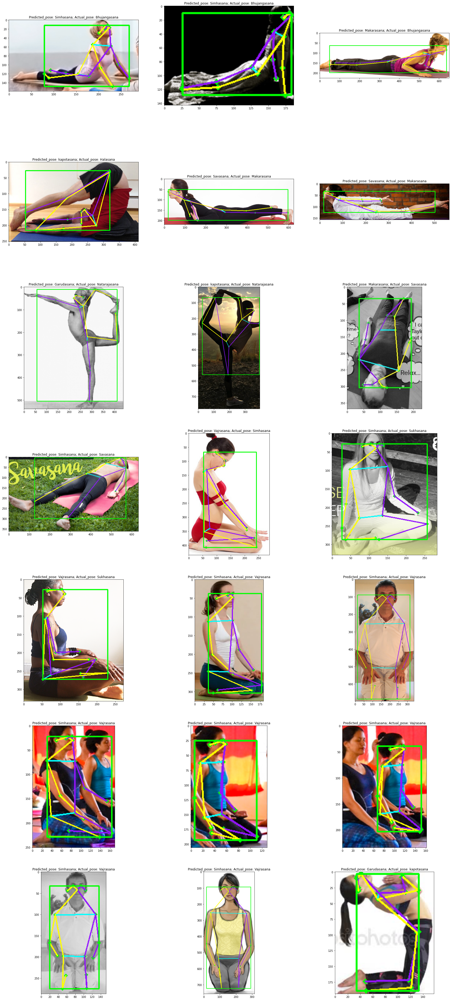

In [ ]:
IMAGE_PER_ROW = 3
MAX_NO_OF_IMAGE_TO_PLOT = 30

# Extract the list of incorrectly predicted poses
false_predicted_pose = [id_in_df for id_in_df in range(len(y_test)) \
                if y_pred_label[id_in_df] != y_true_label[id_in_df]]
if len(false_predicted_pose) > MAX_NO_OF_IMAGE_TO_PLOT:
  false_predicted_pose = false_predicted_pose[:MAX_NO_OF_IMAGE_TO_PLOT]

# Plot the incorrectly predicted images
row_count = len(false_predicted_pose) // IMAGE_PER_ROW + 1
fig = plt.figure(figsize=(10 * IMAGE_PER_ROW, 10 * row_count))
for i, id_in_df in enumerate(false_predicted_pose):
  ax = fig.add_subplot(row_count, IMAGE_PER_ROW, i + 1)
  image_path = os.path.join(images_out_test_folder,
                            df_test.iloc[id_in_df]['file_name'])

  image = cv2.imread(image_path)
  plt.title("Predicted_pose: %s; Actual_pose: %s"
            % (y_pred_label[id_in_df], y_true_label[id_in_df]))
  plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.show()

#Investigate correct predictions

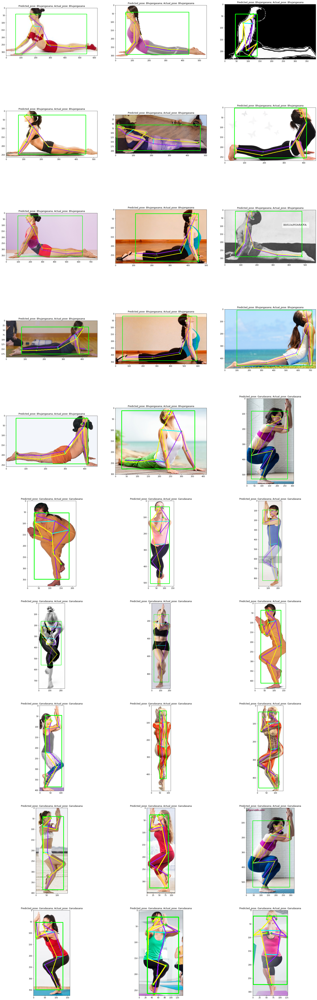

In [ ]:
#prediction function 
IMAGE_PER_ROW = 3
MAX_NO_OF_IMAGE_TO_PLOT = 30

# Extract the list of correctly predicted poses
correct_predicted_pose= [id_in_df for id_in_df in range(len(y_test)) \
                if y_pred_label[id_in_df] == y_true_label[id_in_df]]
if len(correct_predicted_pose) > MAX_NO_OF_IMAGE_TO_PLOT:
  correct_predicted_pose = correct_predicted_pose[:MAX_NO_OF_IMAGE_TO_PLOT]

# Plot the correctly predicted images

row_count = len(correct_predicted_pose) // IMAGE_PER_ROW + 1
fig = plt.figure(figsize=(10 * IMAGE_PER_ROW, 10 * row_count))
for i, id_in_df in enumerate(correct_predicted_pose):
  ax = fig.add_subplot(row_count, IMAGE_PER_ROW, i + 1)
  image_path = os.path.join(images_out_test_folder,
                            df_test.iloc[id_in_df]['file_name'])

  image = cv2.imread(image_path)
  plt.title("Predicted_pose: %s; Actual_pose: %s"
            % (y_pred_label[id_in_df], y_true_label[id_in_df]))
  plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
!mkdir tfjs_model_dir

In [ ]:
!pip install tensorflowjs

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 81 kB 3.9 MB/s 
     |████████████████████████████████| 40 kB 5.6 MB/s 
     |████████████████████████████████| 180 kB 29.2 MB/s 
     |████████████████████████████████| 145 kB 87.8 MB/s 
     |████████████████████████████████| 217 kB 46.0 MB/s 
     |████████████████████████████████| 51 kB 7.1 MB/s 
     |████████████████████████████████| 85 kB 5.0 MB/s 
  Attempting uninstall: packaging
    Found existing installation: packaging 21.3
    Uninstalling packaging-21.3:
      Successfully uninstalled packaging-21.3


In [ ]:
import tensorflowjs as tfjs

In [ ]:
!mkdir tfjs_model_dir

mkdir: cannot create directory ‘tfjs_model_dir’: File exists


In [ ]:
tfjs_model_dir = '/content/tfjs_model_dir'

In [ ]:
tfjs.converters.save_keras_model(model, tfjs_model_dir)

In [ ]:
cd tfjs_model_dir

/content/tfjs_model_dir


In [ ]:
cd ..

/content


In [ ]:
!zip -r tfjsmodel.zip tfjs_model_dir

  adding: tfjs_model_dir/ (stored 0%)
  adding: tfjs_model_dir/group1-shard1of1.bin (deflated 7%)
  adding: tfjs_model_dir/model.json (deflated 88%)
